In [ ]:
AUDIO_PATH = './sample.wav'

In [ ]:
from IPython.display import display, Audio

In [ ]:
display(Audio(AUDIO_PATH))

In [ ]:
import soundfile as sf

In [ ]:
audioFrame, sampleRate = sf.read(AUDIO_PATH)

In [ ]:
print(audioFrame)
print(audioFrame.shape, sampleRate)
print(audioFrame.dtype)

[[-3.05175781e-05  0.00000000e+00]
 [ 9.15527344e-05  0.00000000e+00]
 [-1.52587891e-04  0.00000000e+00]
 ...
 [-6.10351562e-05  6.10351562e-05]
 [ 0.00000000e+00 -6.10351562e-05]
 [ 6.10351562e-05  3.05175781e-05]]
(526073, 2) 44100
float64


In [ ]:
sf.write('./soundfile_audio.flac', audioFrame, sampleRate)

In [ ]:
AUDIO_PATH2 = './soundfile_audio.flac'
display(Audio(AUDIO_PATH2))

In [ ]:
import wave

In [ ]:
wave_object = wave.open(AUDIO_PATH, 'r')
print(wave_object.getparams())
print("Number of channels", wave_object.getnchannels())

_wave_params(nchannels=2, sampwidth=2, framerate=44100, nframes=526073, comptype='NONE', compname='not compressed')
Number of channels 2


In [ ]:
frames = wave_object.readframes(wave_object.getnframes())
sample_rate = wave_object.getframerate()

obj = wave.open('./wave_test.flac', 'w')
obj.setnchannels(1)
obj.setsampwidth(2)
obj.setframerate(sample_rate)
obj.writeframes(frames)
obj.close()

In [ ]:
!pip install pydub

In [ ]:
from pydub import AudioSegment

original_audio = AudioSegment.from_wav(AUDIO_PATH)

In [ ]:
# Volume up and down

audio = original_audio + 20

display(audio)

In [ ]:
# Repeat

audio = original_audio * 2

display(audio)

In [ ]:
# Fade in/out

audio = original_audio.fade_in(3000)
display(audio)

audio = original_audio.fade_out(3000)
display(audio)

In [ ]:
# Reverse

audio = original_audio.reverse()

display(audio)

In [ ]:
# Slicing

first_5 = original_audio[0:(5*1000)]
last_4 = original_audio[-(4*1000):]

concat_audio = first_5 + last_4
display(concat_audio)

In [ ]:
concat_audio.export('./concatted.mp3', format = 'mp3')

<_io.BufferedRandom name='./concatted.mp3'>

In [ ]:
import librosa

audio_data, sample_rate = librosa.load(AUDIO_PATH, sr = 44100)

print(audio_data)
print(audio_data.shape)

[-1.5258789e-05  4.5776367e-05 -7.6293945e-05 ...  0.0000000e+00
 -3.0517578e-05  4.5776367e-05]
(526073,)


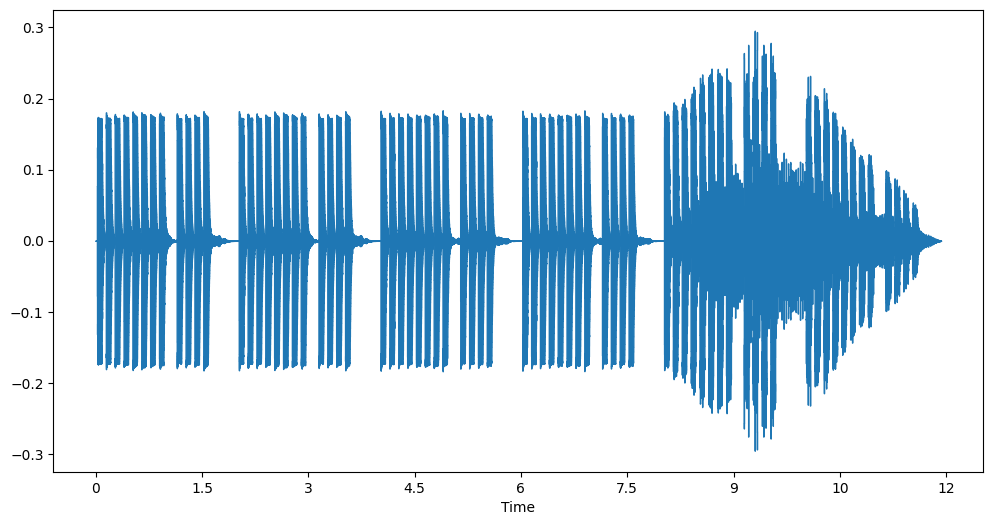

In [ ]:
# Plot wave

import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize = (12,6))
librosa.display.waveshow(audio_data, sr = sample_rate)
plt.show()

In [ ]:
pitch_audio = librosa.effects.pitch_shift(audio_data, sr = sample_rate, n_steps = -4)

display(Audio(pitch_audio, rate = sample_rate))

In [ ]:
stretch_audio = librosa.effects.time_stretch(audio_data, rate = 3)
display(Audio(stretch_audio, rate = sample_rate))

stretch_audio = librosa.effects.time_stretch(audio_data, rate = 0.5)
display(Audio(stretch_audio, rate = sample_rate))

In [ ]:
import numpy as np

In [ ]:
def white_noise(frames, noise_factor):
  noise = np.random.normal(0, frames.std(), frames.size)
  return frames + (noise * noise_factor)

In [ ]:
add_noise = white_noise(audio_data, 0.005)
display(Audio(add_noise, rate = sample_rate))

In [ ]:
def random_gain(frames, min_gain_factor, max_gain_factor):
  gain_factor = np.random.uniform(min_gain_factor, max_gain_factor)
  return frames * gain_factor

In [ ]:
gain_audio = random_gain(audio_data, 1, 100)
display(Audio(gain_audio, rate = sample_rate))

In [48]:
import torchaudio
import torch

frames, sr = torchaudio.load(AUDIO_PATH)
print(frames.shape, sr)

torch.Size([2, 526073]) 44100


In [55]:
def _plot(frames, sample_rate, title):
  frames = frames.numpy()

  nchannels, nframes = frames.shape
  time_axis = torch.arange(0, nframes) / sample_rate

  figure, axes = plt.subplots(nchannels, 1)

  # Mono
  if nchannels == 1:
    axes = [axes]

  # Stereo
  for c in range(nchannels):
    if title == "Waveform":
      axes[c].plot(time_axis, frames[c], linewidth = 1)
      axes[c].grid()
    else:
      axes[c].specgram(frames[c], Fs = sample_rate)

    if nchannels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')

  figure.suptitle(title)
  plt.show()

In [56]:
def plotWave(frames, sample_rate):
  _plot(frames, sample_rate, "Waveform")

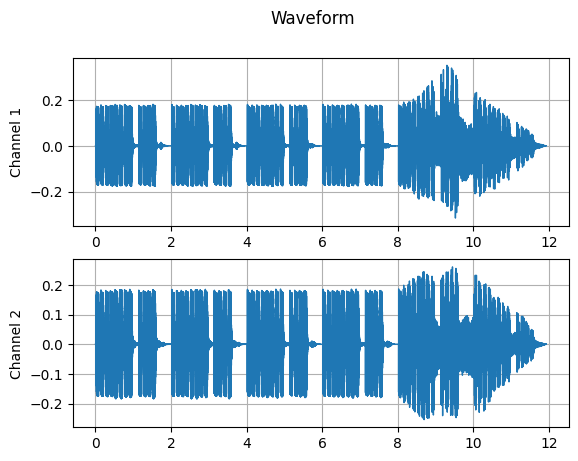

In [57]:
plotWave(frames, sample_rate)

In [58]:
def plotSpectogram(frames, sample_rate):
  _plot(frames, sample_rate, "Spectogram")

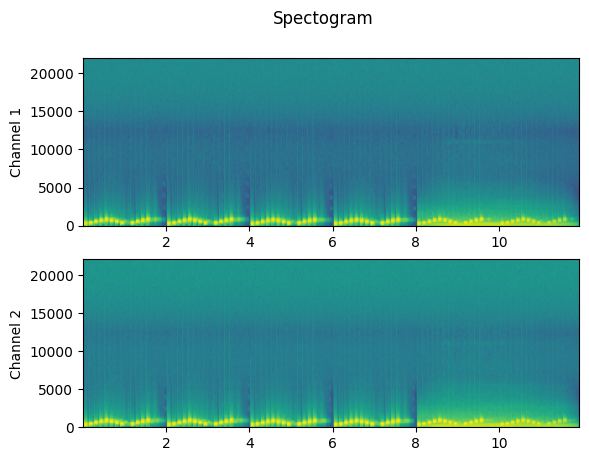

In [59]:
plotSpectogram(frames, sample_rate)

In [60]:
import torchaudio.functional as F

resample_audio = F.resample(frames, sample_rate, 32000)
display(Audio(resample_audio, rate = 32000))